Starting parallel data processing...
Parallel data processing completed.


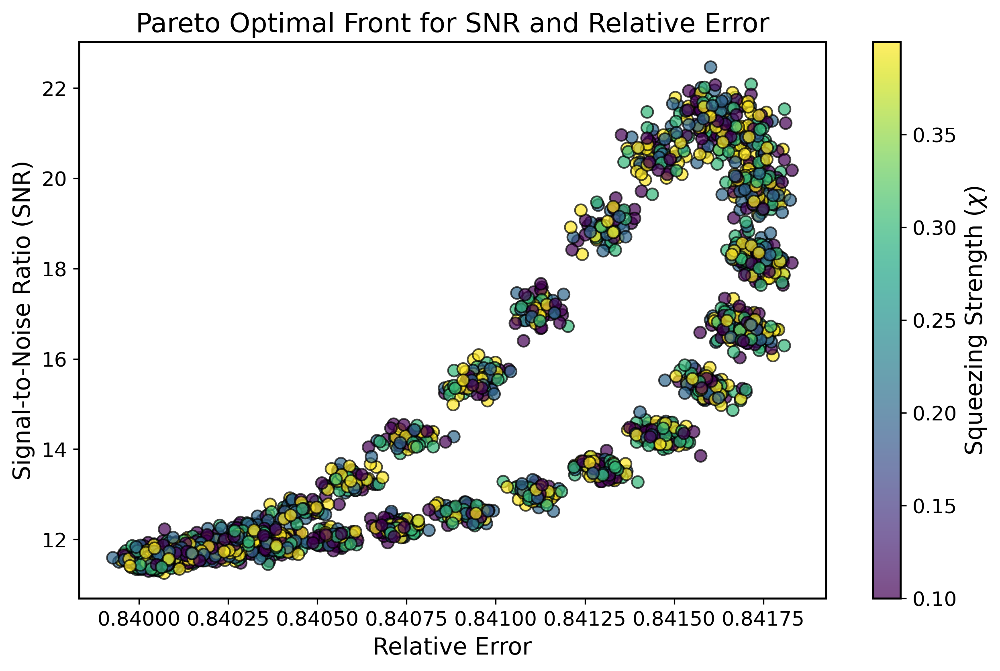

Number of Pareto Optimal Points: 2504

Statistics for Pareto Optimal Points:
  - Average SNR: 14.40
  - Max SNR: 22.46
  - Min SNR: 11.25

  - Average Relative Error: 0.8408
  - Max Relative Error: 0.8418
  - Min Relative Error: 0.8399
Pareto optimal analysis completed.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar
import os
from joblib import Parallel, delayed
import multiprocessing

# -------------------------------
# 1. Configuration and Setup
# -------------------------------

# Create a directory to save the plots
output_dir = 'pareto_plots'
os.makedirs(output_dir, exist_ok=True)

# Update plotting parameters for better aesthetics
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.linewidth': 1.2,
    'lines.linewidth': 1.5,
    'lines.markersize': 6,
})

# -------------------------------
# 2. Define Constants and Parameters
# -------------------------------

# Constants
omega_0 = 1.0
np_val = 4.0
omega_est = omega_0
ns = 30
nspad = 1000

# Squeezing parameters
chi_values = [0, 0.0999, 0.1999, 0.2999, 0.3999]
J_values = [10, 100, 1000]

# Seed for reproducibility
np.random.seed(37)

# Parameters for noise
sigma = 0.03 * omega_0  # 3% of omega_0
dsn = 10000  # Number of noisy samples (reduced for faster execution)

# Define alpha and beta values
alpha_values = np.linspace(0, 2 * np.pi, 30)  # 30 points from 0 to 2pi
beta_values = np.linspace(0, np.pi, 30)        # 30 points from 0 to pi

# -------------------------------
# 3. Define the Expectation Function
# -------------------------------

def jalphabeta(alpha, beta, chi, omega, t, J):
    """
    Computes the expectation value based on the given parameters.
    """
    return J * np.sin(beta) * (np.cos(chi) ** (2 * J - 1)) * np.cos(alpha - omega * t)

# -------------------------------
# 4. Define the FFT Function with Padding
# -------------------------------

def gfft_sig(chi, omega_0, alpha, beta, np_val, omega_est, ns, nspad, J):
    """
    Performs FFT on the padded data and returns the frequency and power spectrum.
    """
    time_sampling = np.linspace(0, np_val * (2 * np.pi) / omega_est, ns)
    data = np.array([jalphabeta(alpha, beta, chi, omega_0, t, J) for t in time_sampling])
    data_padded = np.pad(data, (0, nspad - len(data)), 'constant')
    spectrum_length = len(data_padded) // 2
    # Compute frequency range using np.fft.fftfreq for accuracy
    delta_t = time_sampling[1] - time_sampling[0]
    freq_range = np.fft.fftfreq(nspad, d=delta_t)[:spectrum_length]
    fft_data = np.abs(fft(data_padded))[:spectrum_length] ** 2
    return np.column_stack((freq_range, fft_data))

# -------------------------------
# 5. Define the FFT Data Generation Function
# -------------------------------

def data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn):
    """
    Generates FFT data with added noise.
    """
    delta_omega = np.random.normal(0, sigma, dsn)
    fft_results = []
    for delta in delta_omega:
        current_omega = omega_0 + delta
        fft_result = gfft_sig(chi, current_omega, alpha, beta, np_val, omega_est, ns, nspad, J)
        fft_results.append(fft_result)
    return fft_results

# -------------------------------
# 6. Define the Processing Function for Each Parameter Combination
# -------------------------------

def process_combination(J, chi, alpha, beta):
    """
    Processes a single combination of parameters:
    - Generates FFT data with noise.
    - Computes SNR and Relative Error.
    Returns the results or None if an error occurs.
    """
    try:
        # Generate FFT data with noise
        fft_data = data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn)
        
        # Convert list of arrays to 2D array: (dsn, spectrum_length, 2)
        fft_array = np.array(fft_data)  # Shape: (dsn, spectrum_length, 2)
        
        # Extract frequency and power
        freq_values = fft_array[0, :, 0]  # Frequencies are same across all FFTs
        power_values = fft_array[:, :, 1]  # Shape: (dsn, spectrum_length)
        
        # Calculate average and standard deviation across dsn
        fft_avg = np.mean(power_values, axis=0)  # Shape: (spectrum_length,)
        fft_stddev = np.std(power_values, axis=0)  # Shape: (spectrum_length,)
        
        # Interpolation to find max peak of fft_avg
        fft_avg_interp = interp1d(freq_values, fft_avg, kind='cubic')
        max_peak_freq = minimize_scalar(lambda x: -fft_avg_interp(x),
                                       bounds=(freq_values[0], freq_values[-1]),
                                       method='bounded').x
        
        # Interpolation of SNR data
        snr_data = np.divide(fft_avg, fft_stddev, out=np.zeros_like(fft_avg), where=fft_stddev!=0)
        snr_interp = interp1d(freq_values, snr_data, kind='cubic', bounds_error=False, fill_value="extrapolate")
        max_snr = snr_interp(max_peak_freq)
        
        # Relative Error in Frequency
        relative_error_freq = np.abs(1 - (max_peak_freq / omega_0))
        
        # Store actual alpha and beta (not normalized)
        alpha_actual = alpha  # 0 to 2pi
        beta_actual = beta    # 0 to pi
        
        return (J, chi, alpha_actual, beta_actual, max_snr, relative_error_freq)
    
    except Exception as e:
        print(f"Error processing J={J}, chi={chi}, alpha={alpha}, beta={beta}: {e}")
        return None

# -------------------------------
# 7. Perform Parallel Processing Using Joblib
# -------------------------------

def main():
    # Generate all parameter combinations
    param_combinations = []
    for J in J_values:
        for chi in chi_values:
            for alpha in alpha_values:
                for beta in beta_values:
                    param_combinations.append((J, chi, alpha, beta))
    
    # Determine the number of available CPU cores
    num_cores = multiprocessing.cpu_count()
    
    print("Starting parallel data processing...")
    
    # Perform parallel processing
    results = Parallel(n_jobs=num_cores)(
        delayed(process_combination)(J, chi, alpha, beta) for (J, chi, alpha, beta) in param_combinations
    )
    
    print("Parallel data processing completed.")
    
    # Filter out None results
    results = [res for res in results if res is not None]
    
    # -------------------------------
    # 8. Find Pareto Optimal Points for Each Combination of Alpha and Beta
    # -------------------------------
    pareto_points = []
    for J in J_values:
        for alpha in alpha_values:
            for beta in beta_values:
                # Filter results for chi = 0 and specific alpha, beta
                base_results = [res for res in results if res[0] == J and res[1] == 0 and res[2] == alpha and res[3] == beta]
                if not base_results:
                    continue
                base_result = base_results[0]
                snr_base = base_result[4]
                rel_err_base = base_result[5]
                
                # Find Pareto optimal points for chi > 0 with the same alpha, beta
                for res in results:
                    if res[0] == J and res[1] > 0 and res[2] == alpha and res[3] == beta:
                        _, _, _, _, snr_chi, rel_err_chi = res
                        if snr_chi > snr_base and rel_err_chi < rel_err_base:
                            pareto_points.append(res)
    
    # -------------------------------
    # 9. Plot Pareto Optimal Points
    # -------------------------------

    def plot_pareto_optimal(pareto_points):
        if not pareto_points:
            print("No Pareto optimal points found.")
            return

        fig, ax = plt.subplots(figsize=(10, 6))

        # Extract data for plotting
        J_vals, chi_vals, alpha_vals, beta_vals, snr_vals, rel_err_vals = zip(*pareto_points)

        # Scatter plot of Pareto optimal points
        scatter = ax.scatter(rel_err_vals, snr_vals, c=chi_vals, cmap='viridis', s=50, edgecolors='k', alpha=0.7)
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label(r'Squeezing Strength ($\chi$)', fontsize=14)

        # Set labels and title
        ax.set_xlabel('Relative Error', fontsize=14)
        ax.set_ylabel('Signal-to-Noise Ratio (SNR)', fontsize=14)
        ax.set_title('Pareto Optimal Front for SNR and Relative Error', fontsize=16)

        # Save the plot
        filename = "Pareto_Optimal_Front.pdf"
        filepath = os.path.join(output_dir, filename)
        plt.savefig(filepath, format='pdf')
        plt.show()

    # Plot the Pareto optimal points
    plot_pareto_optimal(pareto_points)

    # -------------------------------
    # 10. Output Statistics for Pareto Optimal Points
    # -------------------------------

    def output_pareto_statistics(pareto_points):
        if not pareto_points:
            print("No Pareto optimal points to display statistics for.")
            return

        num_points = len(pareto_points)
        print(f"Number of Pareto Optimal Points: {num_points}\n")

        # Calculate and display summary statistics
        snr_vals = [point[4] for point in pareto_points]
        rel_err_vals = [point[5] for point in pareto_points]

        print("Statistics for Pareto Optimal Points:")
        print(f"  - Average SNR: {np.mean(snr_vals):.2f}")
        print(f"  - Max SNR: {np.max(snr_vals):.2f}")
        print(f"  - Min SNR: {np.min(snr_vals):.2f}\n")
        print(f"  - Average Relative Error: {np.mean(rel_err_vals):.4f}")
        print(f"  - Max Relative Error: {np.max(rel_err_vals):.4f}")
        print(f"  - Min Relative Error: {np.min(rel_err_vals):.4f}")

    # Output statistics for Pareto optimal points
    output_pareto_statistics(pareto_points)

    print("Pareto optimal analysis completed.")

if __name__ == "__main__":
    main()


Starting parallel data processing...
Parallel data processing completed.


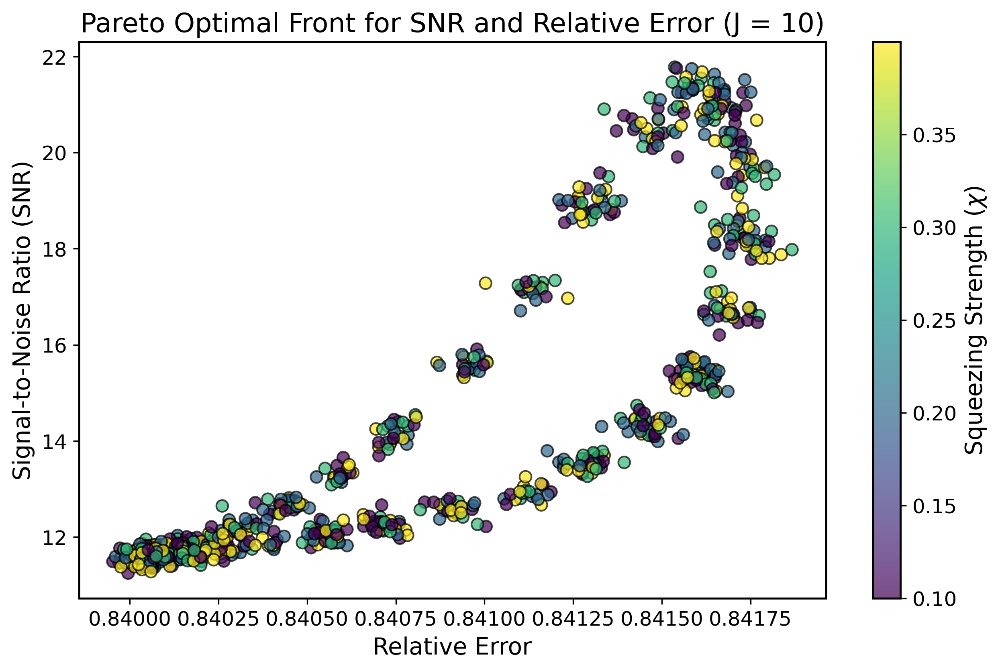

Number of Pareto Optimal Points for J = 10: 902

Statistics for Pareto Optimal Points for J = 10:
  - Average SNR: 14.40
  - Max SNR: 21.78
  - Min SNR: 11.25

  - Average Relative Error: 0.8408
  - Max Relative Error: 0.8419
  - Min Relative Error: 0.8400


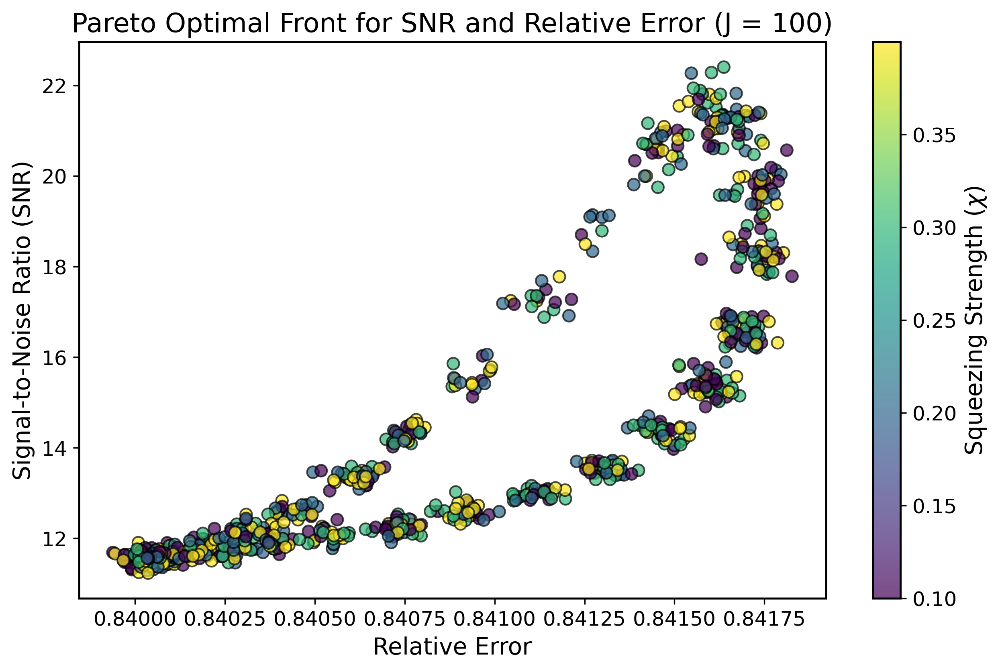

Number of Pareto Optimal Points for J = 100: 857

Statistics for Pareto Optimal Points for J = 100:
  - Average SNR: 14.45
  - Max SNR: 22.40
  - Min SNR: 11.23

  - Average Relative Error: 0.8409
  - Max Relative Error: 0.8418
  - Min Relative Error: 0.8399


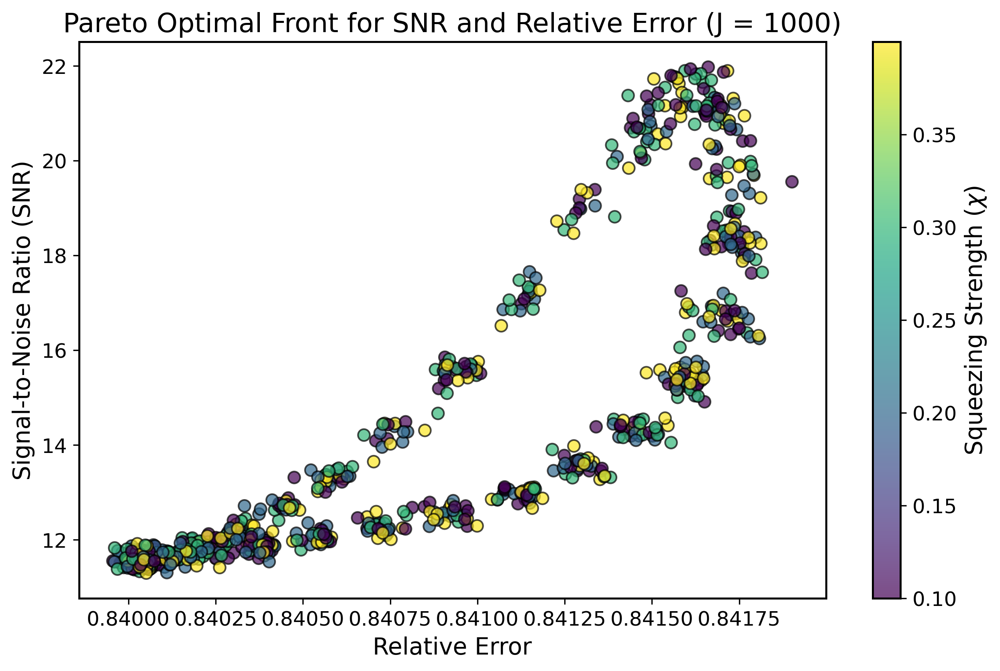

Number of Pareto Optimal Points for J = 1000: 848

Statistics for Pareto Optimal Points for J = 1000:
  - Average SNR: 14.40
  - Max SNR: 21.97
  - Min SNR: 11.29

  - Average Relative Error: 0.8408
  - Max Relative Error: 0.8419
  - Min Relative Error: 0.8400
Pareto optimal analysis completed.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar
import os
from joblib import Parallel, delayed
import multiprocessing

# -------------------------------
# 1. Configuration and Setup
# -------------------------------

# Create a directory to save the plots
output_dir = 'pareto_plots'
os.makedirs(output_dir, exist_ok=True)

# Update plotting parameters for better aesthetics
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.linewidth': 1.2,
    'lines.linewidth': 1.5,
    'lines.markersize': 6,
})

# -------------------------------
# 2. Define Constants and Parameters
# -------------------------------

# Constants
omega_0 = 1.0
np_val = 4.0
omega_est = omega_0
ns = 30
nspad = 1000

# Squeezing parameters
chi_values = [0, 0.0999, 0.1999, 0.2999, 0.3999]
J_values = [10, 100, 1000]

# Seed for reproducibility
np.random.seed(37)

# Parameters for noise
sigma = 0.03 * omega_0  # 3% of omega_0
dsn = 10000  # Number of noisy samples (reduced for faster execution)

# Define alpha and beta values
alpha_values = np.linspace(0, 2 * np.pi, 30)  # 30 points from 0 to 2pi
beta_values = np.linspace(0, np.pi, 30)        # 30 points from 0 to pi

# -------------------------------
# 3. Define the Expectation Function
# -------------------------------

def jalphabeta(alpha, beta, chi, omega, t, J):
    """
    Computes the expectation value based on the given parameters.
    """
    return J * np.sin(beta) * (np.cos(chi) ** (2 * J - 1)) * np.cos(alpha - omega * t)

# -------------------------------
# 4. Define the FFT Function with Padding
# -------------------------------

def gfft_sig(chi, omega_0, alpha, beta, np_val, omega_est, ns, nspad, J):
    """
    Performs FFT on the padded data and returns the frequency and power spectrum.
    """
    time_sampling = np.linspace(0, np_val * (2 * np.pi) / omega_est, ns)
    data = np.array([jalphabeta(alpha, beta, chi, omega_0, t, J) for t in time_sampling])
    data_padded = np.pad(data, (0, nspad - len(data)), 'constant')
    spectrum_length = len(data_padded) // 2
    # Compute frequency range using np.fft.fftfreq for accuracy
    delta_t = time_sampling[1] - time_sampling[0]
    freq_range = np.fft.fftfreq(nspad, d=delta_t)[:spectrum_length]
    fft_data = np.abs(fft(data_padded))[:spectrum_length] ** 2
    return np.column_stack((freq_range, fft_data))

# -------------------------------
# 5. Define the FFT Data Generation Function
# -------------------------------

def data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn):
    """
    Generates FFT data with added noise.
    """
    delta_omega = np.random.normal(0, sigma, dsn)
    fft_results = []
    for delta in delta_omega:
        current_omega = omega_0 + delta
        fft_result = gfft_sig(chi, current_omega, alpha, beta, np_val, omega_est, ns, nspad, J)
        fft_results.append(fft_result)
    return fft_results

# -------------------------------
# 6. Define the Processing Function for Each Parameter Combination
# -------------------------------

def process_combination(J, chi, alpha, beta):
    """
    Processes a single combination of parameters:
    - Generates FFT data with noise.
    - Computes SNR and Relative Error.
    Returns the results or None if an error occurs.
    """
    try:
        # Generate FFT data with noise
        fft_data = data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn)
        
        # Convert list of arrays to 2D array: (dsn, spectrum_length, 2)
        fft_array = np.array(fft_data)  # Shape: (dsn, spectrum_length, 2)
        
        # Extract frequency and power
        freq_values = fft_array[0, :, 0]  # Frequencies are same across all FFTs
        power_values = fft_array[:, :, 1]  # Shape: (dsn, spectrum_length)
        
        # Calculate average and standard deviation across dsn
        fft_avg = np.mean(power_values, axis=0)  # Shape: (spectrum_length,)
        fft_stddev = np.std(power_values, axis=0)  # Shape: (spectrum_length,)
        
        # Interpolation to find max peak of fft_avg
        fft_avg_interp = interp1d(freq_values, fft_avg, kind='cubic')
        max_peak_freq = minimize_scalar(lambda x: -fft_avg_interp(x),
                                       bounds=(freq_values[0], freq_values[-1]),
                                       method='bounded').x
        
        # Interpolation of SNR data
        snr_data = np.divide(fft_avg, fft_stddev, out=np.zeros_like(fft_avg), where=fft_stddev!=0)
        snr_interp = interp1d(freq_values, snr_data, kind='cubic', bounds_error=False, fill_value="extrapolate")
        max_snr = snr_interp(max_peak_freq)
        
        # Relative Error in Frequency
        relative_error_freq = np.abs(1 - (max_peak_freq / omega_0))
        
        # Store actual alpha and beta (not normalized)
        alpha_actual = alpha  # 0 to 2pi
        beta_actual = beta    # 0 to pi
        
        return (J, chi, alpha_actual, beta_actual, max_snr, relative_error_freq)
    
    except Exception as e:
        print(f"Error processing J={J}, chi={chi}, alpha={alpha}, beta={beta}: {e}")
        return None

# -------------------------------
# 7. Perform Parallel Processing Using Joblib
# -------------------------------

def main():
    # Generate all parameter combinations
    param_combinations = []
    for J in J_values:
        for chi in chi_values:
            for alpha in alpha_values:
                for beta in beta_values:
                    param_combinations.append((J, chi, alpha, beta))
    
    # Determine the number of available CPU cores
    num_cores = multiprocessing.cpu_count()
    
    print("Starting parallel data processing...")
    
    # Perform parallel processing
    results = Parallel(n_jobs=num_cores)(
        delayed(process_combination)(J, chi, alpha, beta) for (J, chi, alpha, beta) in param_combinations
    )
    
    print("Parallel data processing completed.")
    
    # Filter out None results
    results = [res for res in results if res is not None]
    
    # -------------------------------
    # 8. Find Pareto Optimal Points for Each Combination of Alpha and Beta for Each J
    # -------------------------------
    for J in J_values:
        pareto_points = []
        for alpha in alpha_values:
            for beta in beta_values:
                # Filter results for chi = 0 and specific alpha, beta
                base_results = [res for res in results if res[0] == J and res[1] == 0 and res[2] == alpha and res[3] == beta]
                if not base_results:
                    continue
                base_result = base_results[0]
                snr_base = base_result[4]
                rel_err_base = base_result[5]
                
                # Find Pareto optimal points for chi > 0 with the same alpha, beta
                for res in results:
                    if res[0] == J and res[1] > 0 and res[2] == alpha and res[3] == beta:
                        _, _, _, _, snr_chi, rel_err_chi = res
                        if snr_chi > snr_base and rel_err_chi < rel_err_base:
                            pareto_points.append(res)
        
        # -------------------------------
        # 9. Plot Pareto Optimal Points for Each J
        # -------------------------------

        def plot_pareto_optimal(pareto_points, J):
            if not pareto_points:
                print(f"No Pareto optimal points found for J = {J}.")
                return

            fig, ax = plt.subplots(figsize=(10, 6))

            # Extract data for plotting
            J_vals, chi_vals, alpha_vals, beta_vals, snr_vals, rel_err_vals = zip(*pareto_points)

            # Scatter plot of Pareto optimal points
            scatter = ax.scatter(rel_err_vals, snr_vals, c=chi_vals, cmap='viridis', s=50, edgecolors='k', alpha=0.7)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(r'Squeezing Strength ($\chi$)', fontsize=14)

            # Set labels and title
            ax.set_xlabel('Relative Error', fontsize=14)
            ax.set_ylabel('Signal-to-Noise Ratio (SNR)', fontsize=14)
            ax.set_title(f'Pareto Optimal Front for SNR and Relative Error (J = {J})', fontsize=16)

            # Save the plot
            filename = f"Pareto_Optimal_Front_Jab_{J}.pdf"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format='pdf')
            plt.show()

        # Plot the Pareto optimal points for the current J
        plot_pareto_optimal(pareto_points, J)

        # -------------------------------
        # 10. Output Statistics for Pareto Optimal Points for Each J
        # -------------------------------

        def output_pareto_statistics(pareto_points, J):
            if not pareto_points:
                print(f"No Pareto optimal points to display statistics for J = {J}.")
                return

            num_points = len(pareto_points)
            print(f"Number of Pareto Optimal Points for J = {J}: {num_points}\n")

            # Calculate and display summary statistics
            snr_vals = [point[4] for point in pareto_points]
            rel_err_vals = [point[5] for point in pareto_points]

            print(f"Statistics for Pareto Optimal Points for J = {J}:")
            print(f"  - Average SNR: {np.mean(snr_vals):.2f}")
            print(f"  - Max SNR: {np.max(snr_vals):.2f}")
            print(f"  - Min SNR: {np.min(snr_vals):.2f}\n")
            print(f"  - Average Relative Error: {np.mean(rel_err_vals):.4f}")
            print(f"  - Max Relative Error: {np.max(rel_err_vals):.4f}")
            print(f"  - Min Relative Error: {np.min(rel_err_vals):.4f}")

        # Output statistics for Pareto optimal points for the current J
        output_pareto_statistics(pareto_points, J)

    print("Pareto optimal analysis completed.")

if __name__ == "__main__":
    main()


Starting parallel data processing...
Parallel data processing completed.


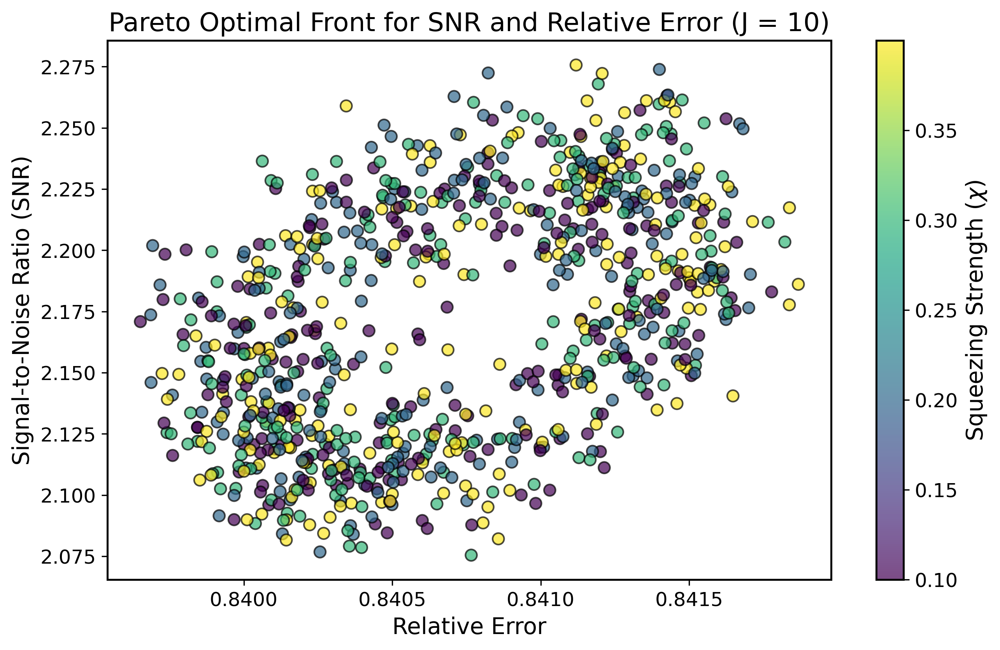

Number of Pareto Optimal Points for J = 10: 872

Statistics for Pareto Optimal Points for J = 10:
  - Average SNR: 2.17
  - Max SNR: 2.28
  - Min SNR: 2.08

  - Average Relative Error: 0.8407
  - Max Relative Error: 0.8419
  - Min Relative Error: 0.8397

At least ten Pareto optimal combinations for J = 10 where chi > 0:

  Example 1: J = 10, chi = 0.3999, alpha = 0.0000, beta = 0.1083, SNR = 2.11, Relative Error = 0.8403
  Example 2: J = 10, chi = 0.0999, alpha = 0.0000, beta = 0.2167, SNR = 2.11, Relative Error = 0.8405
  Example 3: J = 10, chi = 0.3999, alpha = 0.0000, beta = 0.5417, SNR = 2.11, Relative Error = 0.8399
  Example 4: J = 10, chi = 0.3999, alpha = 0.0000, beta = 0.8666, SNR = 2.11, Relative Error = 0.8402
  Example 5: J = 10, chi = 0.0999, alpha = 0.0000, beta = 1.1916, SNR = 2.11, Relative Error = 0.8405
  Example 6: J = 10, chi = 0.0999, alpha = 0.0000, beta = 1.8416, SNR = 2.10, Relative Error = 0.8401
  Example 7: J = 10, chi = 0.2999, alpha = 0.0000, beta = 1.8416,

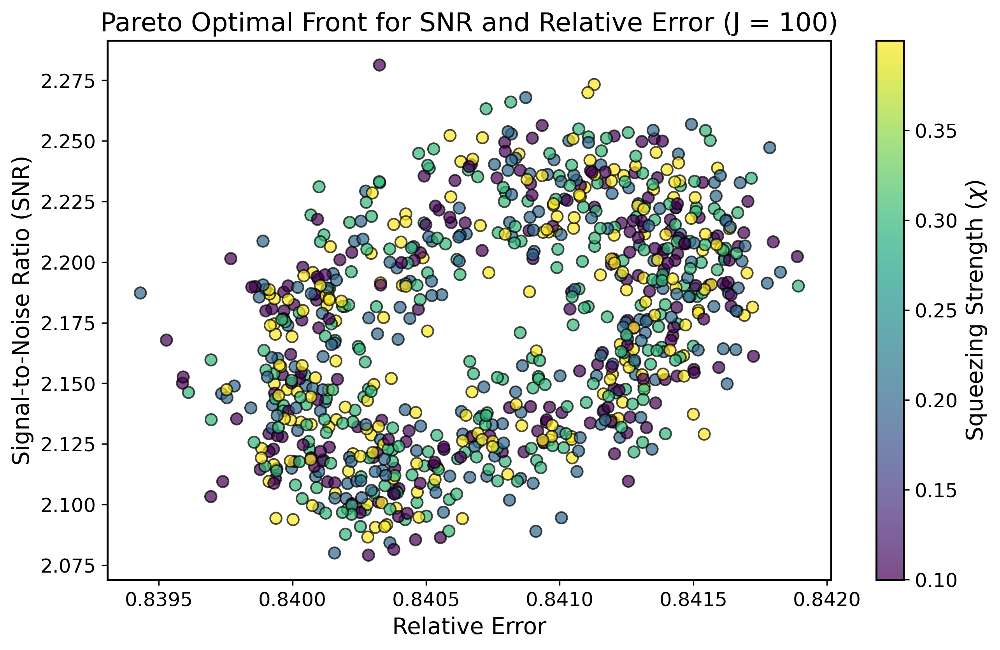

Number of Pareto Optimal Points for J = 100: 865

Statistics for Pareto Optimal Points for J = 100:
  - Average SNR: 2.17
  - Max SNR: 2.28
  - Min SNR: 2.08

  - Average Relative Error: 0.8408
  - Max Relative Error: 0.8419
  - Min Relative Error: 0.8394

At least ten Pareto optimal combinations for J = 100 where chi > 0:

  Example 1: J = 100, chi = 0.0999, alpha = 0.0000, beta = 0.1083, SNR = 2.10, Relative Error = 0.8403
  Example 2: J = 100, chi = 0.3999, alpha = 0.0000, beta = 0.1083, SNR = 2.09, Relative Error = 0.8404
  Example 3: J = 100, chi = 0.1999, alpha = 0.0000, beta = 0.3250, SNR = 2.11, Relative Error = 0.8402
  Example 4: J = 100, chi = 0.2999, alpha = 0.0000, beta = 0.3250, SNR = 2.11, Relative Error = 0.8405
  Example 5: J = 100, chi = 0.3999, alpha = 0.0000, beta = 0.3250, SNR = 2.10, Relative Error = 0.8403
  Example 6: J = 100, chi = 0.1999, alpha = 0.0000, beta = 0.5417, SNR = 2.10, Relative Error = 0.8405
  Example 7: J = 100, chi = 0.3999, alpha = 0.0000, beta

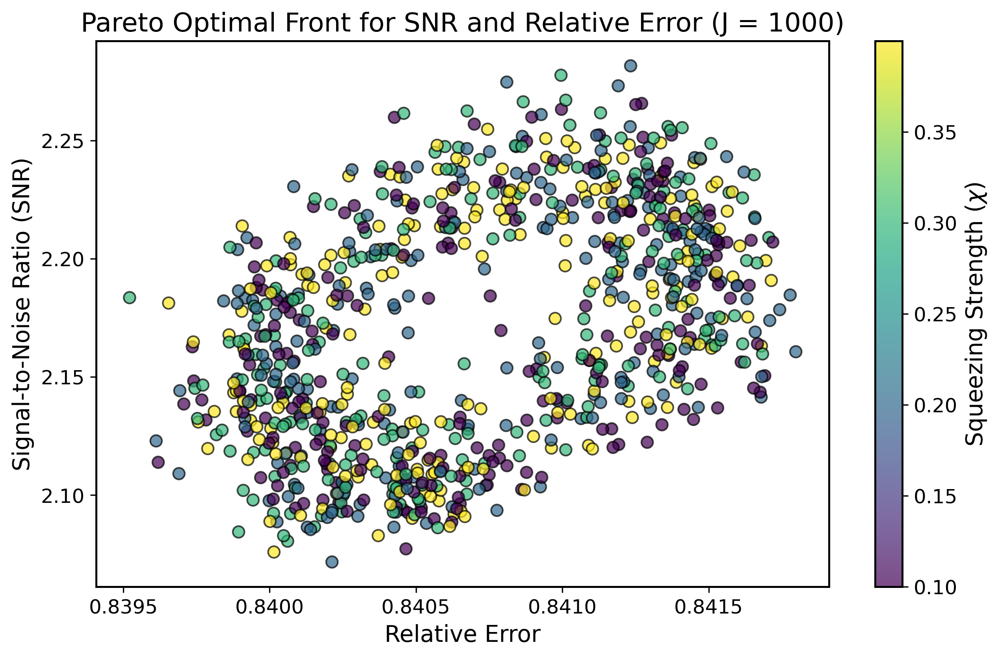

Number of Pareto Optimal Points for J = 1000: 908

Statistics for Pareto Optimal Points for J = 1000:
  - Average SNR: 2.17
  - Max SNR: 2.28
  - Min SNR: 2.07

  - Average Relative Error: 0.8407
  - Max Relative Error: 0.8418
  - Min Relative Error: 0.8395

At least ten Pareto optimal combinations for J = 1000 where chi > 0:

  Example 1: J = 1000, chi = 0.2999, alpha = 0.0000, beta = 0.1083, SNR = 2.10, Relative Error = 0.8403
  Example 2: J = 1000, chi = 0.0999, alpha = 0.0000, beta = 0.2167, SNR = 2.12, Relative Error = 0.8406
  Example 3: J = 1000, chi = 0.1999, alpha = 0.0000, beta = 0.2167, SNR = 2.13, Relative Error = 0.8404
  Example 4: J = 1000, chi = 0.2999, alpha = 0.0000, beta = 0.2167, SNR = 2.10, Relative Error = 0.8404
  Example 5: J = 1000, chi = 0.2999, alpha = 0.0000, beta = 0.3250, SNR = 2.08, Relative Error = 0.8401
  Example 6: J = 1000, chi = 0.2999, alpha = 0.0000, beta = 0.5417, SNR = 2.08, Relative Error = 0.8399
  Example 7: J = 1000, chi = 0.0999, alpha = 0.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar
import os
from joblib import Parallel, delayed
import multiprocessing

# -------------------------------
# 1. Configuration and Setup
# -------------------------------

# Create a directory to save the plots
output_dir = 'pareto_plots'
os.makedirs(output_dir, exist_ok=True)

# Update plotting parameters for better aesthetics
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.linewidth': 1.2,
    'lines.linewidth': 1.5,
    'lines.markersize': 6,
})

# -------------------------------
# 2. Define Constants and Parameters
# -------------------------------

# Constants
omega_0 = 1.0
np_val = 4.0
omega_est = omega_0
ns = 30
nspad = 1000

# Squeezing parameters
chi_values = [0, 0.0999, 0.1999, 0.2999, 0.3999]
J_values = [10, 100, 1000]

# Seed for reproducibility
np.random.seed(37)

# Parameters for noise
sigma = 0.1 * omega_0  # 10% of omega_0
dsn = 10000  # Number of noisy samples (reduced for faster execution)

# Define alpha and beta values
alpha_values = np.linspace(0, 2 * np.pi, 30)  # 30 points from 0 to 2pi
beta_values = np.linspace(0, np.pi, 30)        # 30 points from 0 to pi

# -------------------------------
# 3. Define the Expectation Function
# -------------------------------

def jalphabeta(alpha, beta, chi, omega, t, J):
    """
    Computes the expectation value based on the given parameters.
    """
    return J * np.sin(beta) * (np.cos(chi) ** (2 * J - 1)) * np.cos(alpha - omega * t)

# -------------------------------
# 4. Define the FFT Function with Padding
# -------------------------------

def gfft_sig(chi, omega_0, alpha, beta, np_val, omega_est, ns, nspad, J):
    """
    Performs FFT on the padded data and returns the frequency and power spectrum.
    """
    time_sampling = np.linspace(0, np_val * (2 * np.pi) / omega_est, ns)
    data = np.array([jalphabeta(alpha, beta, chi, omega_0, t, J) for t in time_sampling])
    data_padded = np.pad(data, (0, nspad - len(data)), 'constant')
    spectrum_length = len(data_padded) // 2
    # Compute frequency range using np.fft.fftfreq for accuracy
    delta_t = time_sampling[1] - time_sampling[0]
    freq_range = np.fft.fftfreq(nspad, d=delta_t)[:spectrum_length]
    fft_data = np.abs(fft(data_padded))[:spectrum_length] ** 2
    return np.column_stack((freq_range, fft_data))

# -------------------------------
# 5. Define the FFT Data Generation Function
# -------------------------------

def data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn):
    """
    Generates FFT data with added noise.
    """
    delta_omega = np.random.normal(0, sigma, dsn)
    fft_results = []
    for delta in delta_omega:
        current_omega = omega_0 + delta
        fft_result = gfft_sig(chi, current_omega, alpha, beta, np_val, omega_est, ns, nspad, J)
        fft_results.append(fft_result)
    return fft_results

# -------------------------------
# 6. Define the Processing Function for Each Parameter Combination
# -------------------------------

def process_combination(J, chi, alpha, beta):
    """
    Processes a single combination of parameters:
    - Generates FFT data with noise.
    - Computes SNR and Relative Error.
    Returns the results or None if an error occurs.
    """
    try:
        # Generate FFT data with noise
        fft_data = data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn)
        
        # Convert list of arrays to 2D array: (dsn, spectrum_length, 2)
        fft_array = np.array(fft_data)  # Shape: (dsn, spectrum_length, 2)
        
        # Extract frequency and power
        freq_values = fft_array[0, :, 0]  # Frequencies are same across all FFTs
        power_values = fft_array[:, :, 1]  # Shape: (dsn, spectrum_length)
        
        # Calculate average and standard deviation across dsn
        fft_avg = np.mean(power_values, axis=0)  # Shape: (spectrum_length,)
        fft_stddev = np.std(power_values, axis=0)  # Shape: (spectrum_length,)
        
        # Interpolation to find max peak of fft_avg
        fft_avg_interp = interp1d(freq_values, fft_avg, kind='cubic')
        max_peak_freq = minimize_scalar(lambda x: -fft_avg_interp(x),
                                       bounds=(freq_values[0], freq_values[-1]),
                                       method='bounded').x
        
        # Interpolation of SNR data
        snr_data = np.divide(fft_avg, fft_stddev, out=np.zeros_like(fft_avg), where=fft_stddev!=0)
        snr_interp = interp1d(freq_values, snr_data, kind='cubic', bounds_error=False, fill_value="extrapolate")
        max_snr = snr_interp(max_peak_freq)
        
        # Relative Error in Frequency
        relative_error_freq = np.abs(1 - (max_peak_freq / omega_0))
        
        # Store actual alpha and beta (not normalized)
        alpha_actual = alpha  # 0 to 2pi
        beta_actual = beta    # 0 to pi
        
        return (J, chi, alpha_actual, beta_actual, max_snr, relative_error_freq)
    
    except Exception as e:
        print(f"Error processing J={J}, chi={chi}, alpha={alpha}, beta={beta}: {e}")
        return None

# -------------------------------
# 7. Perform Parallel Processing Using Joblib
# -------------------------------

def main():
    # Generate all parameter combinations
    param_combinations = []
    for J in J_values:
        for chi in chi_values:
            for alpha in alpha_values:
                for beta in beta_values:
                    param_combinations.append((J, chi, alpha, beta))
    
    # Determine the number of available CPU cores
    num_cores = multiprocessing.cpu_count()
    
    print("Starting parallel data processing...")
    
    # Perform parallel processing
    results = Parallel(n_jobs=num_cores)(
        delayed(process_combination)(J, chi, alpha, beta) for (J, chi, alpha, beta) in param_combinations
    )
    
    print("Parallel data processing completed.")
    
    # Filter out None results
    results = [res for res in results if res is not None]
    
    # -------------------------------
    # 8. Find Pareto Optimal Points for Each Combination of Alpha and Beta for Each J
    # -------------------------------
    for J in J_values:
        pareto_points = []
        ten_pareto_examples = []
        for alpha in alpha_values:
            for beta in beta_values:
                # Filter results for chi = 0 and specific alpha, beta
                base_results = [res for res in results if res[0] == J and res[1] == 0 and res[2] == alpha and res[3] == beta]
                if not base_results:
                    continue
                base_result = base_results[0]
                snr_base = base_result[4]
                rel_err_base = base_result[5]
                
                # Find Pareto optimal points for chi > 0 with the same alpha, beta
                for res in results:
                    if res[0] == J and res[1] > 0 and res[2] == alpha and res[3] == beta:
                        _, chi, alpha_val, beta_val, snr_chi, rel_err_chi = res
                        if snr_chi > snr_base and rel_err_chi < rel_err_base:
                            pareto_points.append(res)
                            # Collect at least ten examples where chi > 0
                            if len(ten_pareto_examples) < 10:
                                ten_pareto_examples.append((J, chi, alpha_val, beta_val, snr_chi, rel_err_chi))
        
        # -------------------------------
        # 9. Plot Pareto Optimal Points for Each J
        # -------------------------------

        def plot_pareto_optimal(pareto_points, J):
            if not pareto_points:
                print(f"No Pareto optimal points found for J = {J}.")
                return

            fig, ax = plt.subplots(figsize=(10, 6))

            # Extract data for plotting
            J_vals, chi_vals, alpha_vals, beta_vals, snr_vals, rel_err_vals = zip(*pareto_points)

            # Scatter plot of Pareto optimal points
            scatter = ax.scatter(rel_err_vals, snr_vals, c=chi_vals, cmap='viridis', s=50, edgecolors='k', alpha=0.7)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(r'Squeezing Strength ($\chi$)', fontsize=14)

            # Set labels and title
            ax.set_xlabel('Relative Error', fontsize=14)
            ax.set_ylabel('Signal-to-Noise Ratio (SNR)', fontsize=14)
            ax.set_title(f'Pareto Optimal Front for SNR and Relative Error (J = {J})', fontsize=16)

            # Save the plot
            filename = f"Pareto_Optimal_Front_Jalpaten_{J}.pdf"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format='pdf')
            plt.show()

        # Plot the Pareto optimal points for the current J
        plot_pareto_optimal(pareto_points, J)

        # -------------------------------
        # 10. Output Statistics for Pareto Optimal Points for Each J
        # -------------------------------

        def output_pareto_statistics(pareto_points, ten_pareto_examples, J):
            if not pareto_points:
                print(f"No Pareto optimal points to display statistics for J = {J}.")
                return

            num_points = len(pareto_points)
            print(f"Number of Pareto Optimal Points for J = {J}: {num_points}\n")

            # Calculate and display summary statistics
            snr_vals = [point[4] for point in pareto_points]
            rel_err_vals = [point[5] for point in pareto_points]

            print(f"Statistics for Pareto Optimal Points for J = {J}:")
            print(f"  - Average SNR: {np.mean(snr_vals):.2f}")
            print(f"  - Max SNR: {np.max(snr_vals):.2f}")
            print(f"  - Min SNR: {np.min(snr_vals):.2f}\n")
            print(f"  - Average Relative Error: {np.mean(rel_err_vals):.4f}")
            print(f"  - Max Relative Error: {np.max(rel_err_vals):.4f}")
            print(f"  - Min Relative Error: {np.min(rel_err_vals):.4f}\n")

            # Output information for at least ten Pareto optimal combinations where chi > 0
            print(f"At least ten Pareto optimal combinations for J = {J} where chi > 0:\n")
            for idx, example in enumerate(ten_pareto_examples):
                J, chi, alpha, beta, snr, rel_err = example
                print(f"  Example {idx + 1}: J = {J}, chi = {chi}, alpha = {alpha:.4f}, beta = {beta:.4f}, SNR = {snr:.2f}, Relative Error = {rel_err:.4f}")

        # Output statistics for Pareto optimal points for the current J
        output_pareto_statistics(pareto_points, ten_pareto_examples, J)

    print("Pareto optimal analysis completed.")

if __name__ == "__main__":
    main()


Starting parallel data processing...
Parallel data processing completed.


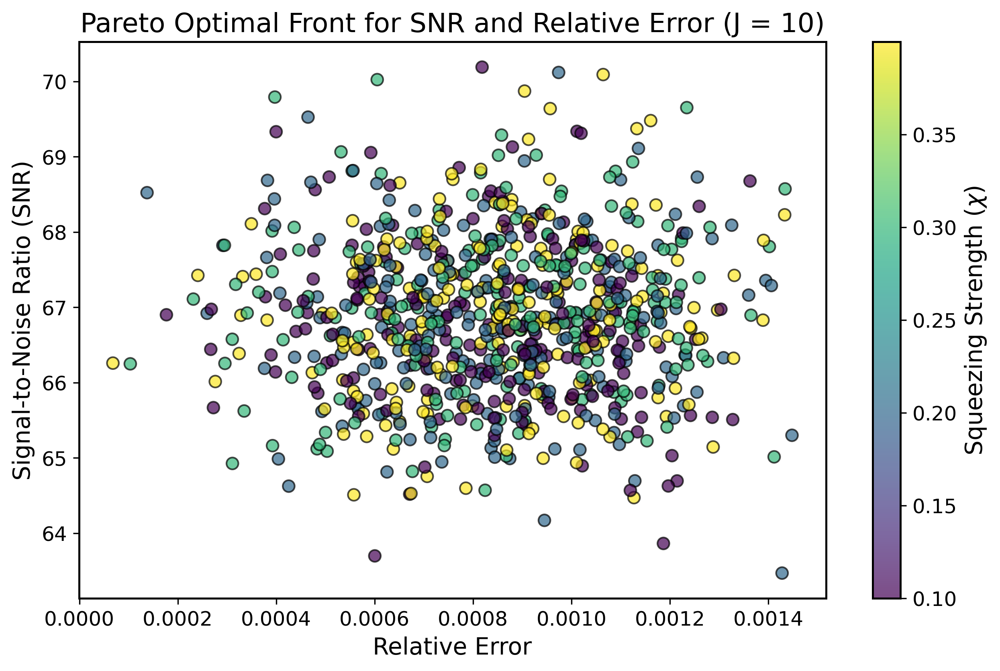

Number of Pareto Optimal Points for J = 10: 856

Statistics for Pareto Optimal Points for J = 10:
  - Average SNR: 66.87
  - Max SNR: 70.19
  - Min SNR: 63.47

  - Average Relative Error: 0.0008
  - Max Relative Error: 0.0014
  - Min Relative Error: 0.0001

At least ten Pareto optimal combinations for J = 10 where chi > 0:

  Example 1: J = 10, chi = 0.2999, alpha = 0.0000, beta = 0.1083, SNR = 66.62, Relative Error = 0.0005
  Example 2: J = 10, chi = 0.3999, alpha = 0.0000, beta = 0.1083, SNR = 67.78, Relative Error = 0.0009
  Example 3: J = 10, chi = 0.0999, alpha = 0.0000, beta = 0.2167, SNR = 66.44, Relative Error = 0.0008
  Example 4: J = 10, chi = 0.0999, alpha = 0.0000, beta = 0.3250, SNR = 66.44, Relative Error = 0.0003
  Example 5: J = 10, chi = 0.2999, alpha = 0.0000, beta = 0.3250, SNR = 67.76, Relative Error = 0.0008
  Example 6: J = 10, chi = 0.3999, alpha = 0.0000, beta = 0.3250, SNR = 64.60, Relative Error = 0.0008
  Example 7: J = 10, chi = 0.3999, alpha = 0.0000, beta 

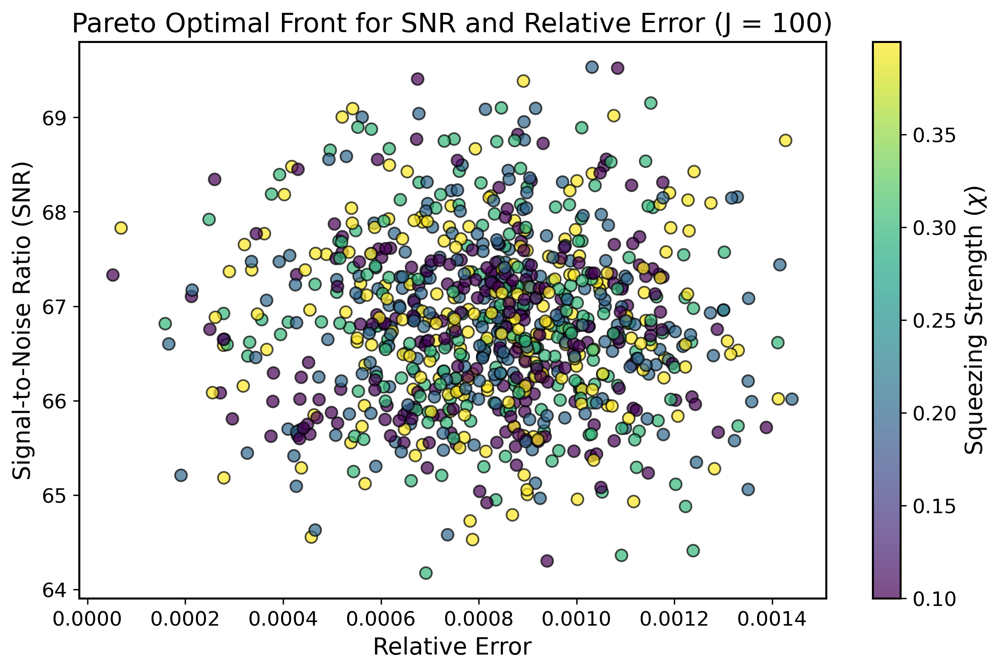

Number of Pareto Optimal Points for J = 100: 895

Statistics for Pareto Optimal Points for J = 100:
  - Average SNR: 66.81
  - Max SNR: 69.53
  - Min SNR: 64.17

  - Average Relative Error: 0.0008
  - Max Relative Error: 0.0014
  - Min Relative Error: 0.0001

At least ten Pareto optimal combinations for J = 100 where chi > 0:

  Example 1: J = 100, chi = 0.1999, alpha = 0.0000, beta = 0.1083, SNR = 66.26, Relative Error = 0.0009
  Example 2: J = 100, chi = 0.3999, alpha = 0.0000, beta = 0.1083, SNR = 67.09, Relative Error = 0.0007
  Example 3: J = 100, chi = 0.3999, alpha = 0.0000, beta = 0.2167, SNR = 65.21, Relative Error = 0.0009
  Example 4: J = 100, chi = 0.0999, alpha = 0.0000, beta = 0.3250, SNR = 67.62, Relative Error = 0.0006
  Example 5: J = 100, chi = 0.3999, alpha = 0.0000, beta = 0.4333, SNR = 65.53, Relative Error = 0.0007
  Example 6: J = 100, chi = 0.1999, alpha = 0.0000, beta = 0.7583, SNR = 67.07, Relative Error = 0.0007
  Example 7: J = 100, chi = 0.0999, alpha = 0.0

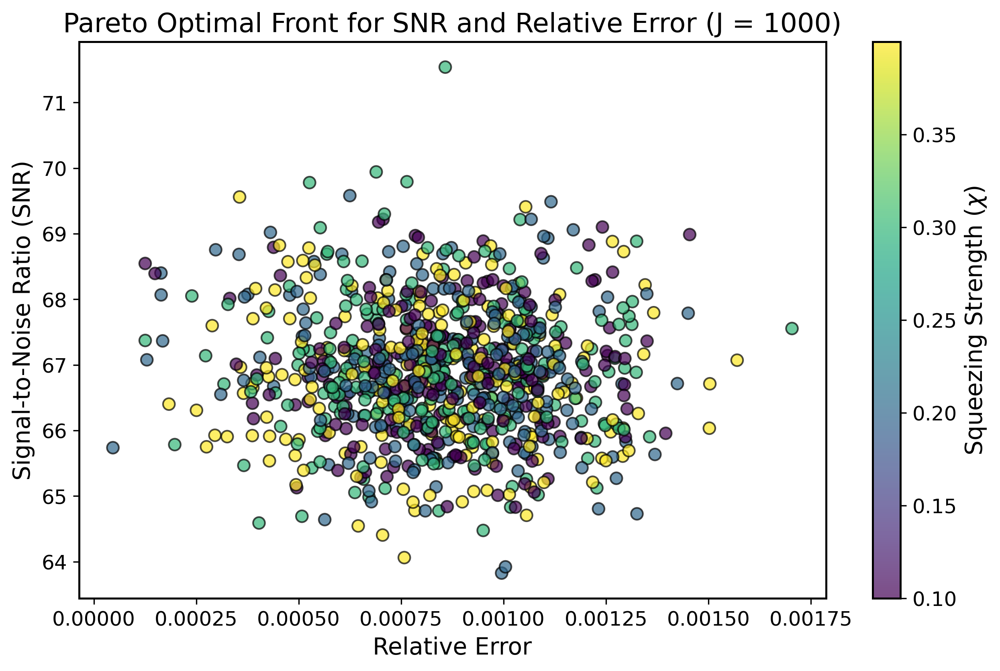

Number of Pareto Optimal Points for J = 1000: 911

Statistics for Pareto Optimal Points for J = 1000:
  - Average SNR: 66.88
  - Max SNR: 71.54
  - Min SNR: 63.82

  - Average Relative Error: 0.0009
  - Max Relative Error: 0.0017
  - Min Relative Error: 0.0000

At least ten Pareto optimal combinations for J = 1000 where chi > 0:

  Example 1: J = 1000, chi = 0.0999, alpha = 0.0000, beta = 0.1083, SNR = 65.61, Relative Error = 0.0009
  Example 2: J = 1000, chi = 0.3999, alpha = 0.0000, beta = 0.1083, SNR = 66.65, Relative Error = 0.0004
  Example 3: J = 1000, chi = 0.0999, alpha = 0.0000, beta = 0.2167, SNR = 66.84, Relative Error = 0.0008
  Example 4: J = 1000, chi = 0.0999, alpha = 0.0000, beta = 0.4333, SNR = 67.26, Relative Error = 0.0010
  Example 5: J = 1000, chi = 0.1999, alpha = 0.0000, beta = 0.4333, SNR = 68.08, Relative Error = 0.0004
  Example 6: J = 1000, chi = 0.1999, alpha = 0.0000, beta = 0.6500, SNR = 66.53, Relative Error = 0.0007
  Example 7: J = 1000, chi = 0.2999, a

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar
from scipy.signal import blackmanharris
import os
from joblib import Parallel, delayed
import multiprocessing

# -------------------------------
# 1. Configuration and Setup
# -------------------------------

# Create a directory to save the plots
output_dir = 'pareto_plots'
os.makedirs(output_dir, exist_ok=True)

# Update plotting parameters for better aesthetics
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.linewidth': 1.2,
    'lines.linewidth': 1.5,
    'lines.markersize': 6,
})

# -------------------------------
# 2. Define Constants and Parameters
# -------------------------------

# Constants
omega_0 = 1.0
np_val = 4.0
omega_est = omega_0
ns = 30
nspad = 1000

# Squeezing parameters
chi_values = [0, 0.0999, 0.1999, 0.2999, 0.3999]
J_values = [10, 100, 1000]

# Seed for reproducibility
np.random.seed(37)

# Parameters for noise
sigma = 0.1 * omega_0  # 10% of omega_0
dsn = 10000  # Number of noisy samples (reduced for faster execution)

# Define alpha and beta values
alpha_values = np.linspace(0, 2 * np.pi, 30)  # 30 points from 0 to 2pi
beta_values = np.linspace(0, np.pi, 30)        # 30 points from 0 to pi

# -------------------------------
# 3. Define the Expectation Function
# -------------------------------

def jalphabeta(alpha, beta, chi, omega, t, J):
    """
    Computes the expectation value based on the given parameters.
    """
    return J * np.sin(beta) * (np.cos(chi) ** (2 * J - 1)) * np.cos(alpha - omega * t)

# -------------------------------
# 4. Define the FFT Function with Padding
# -------------------------------

def gfft_sig(chi, omega_0, alpha, beta, np_val, omega_est, ns, nspad, J):
    """
    Performs BMH FFT on the padded data and returns the frequency and power spectrum.
    """
    T_max = np_val * (2 * np.pi) / omega_est
    delta_t = (np_val / (ns - 1)) * (2 * np.pi) / omega_est
    time_sampling = np.linspace(0, T_max, ns)

    # Generate Blackman-Harris window
    window = blackmanharris(ns)

    # Data calculation with window applied
    data = np.array([jalphabeta(alpha, beta, chi, omega_0, t, J) for t in time_sampling]) * window

    # Zero-padding
    data_padded = np.pad(data, (0, nspad - len(data)), 'constant')
    spectrum_length = len(data_padded) // 2
    freq_range = (2 * np.pi) / ((nspad - 1) * delta_t) * np.arange(spectrum_length)
    fft_data = np.abs(fft(data_padded))[:spectrum_length] ** 2
    return np.column_stack((freq_range, fft_data))

# -------------------------------
# 5. Define the FFT Data Generation Function
# -------------------------------

def data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn):
    """
    Generates FFT data with added noise.
    """
    delta_omega = np.random.normal(0, sigma, dsn)
    fft_results = []
    for delta in delta_omega:
        current_omega = omega_0 + delta
        fft_result = gfft_sig(chi, current_omega, alpha, beta, np_val, omega_est, ns, nspad, J)
        fft_results.append(fft_result)
    return fft_results

# -------------------------------
# 6. Define the Processing Function for Each Parameter Combination
# -------------------------------

def process_combination(J, chi, alpha, beta):
    """
    Processes a single combination of parameters:
    - Generates FFT data with noise.
    - Computes SNR and Relative Error.
    Returns the results or None if an error occurs.
    """
    try:
        # Generate FFT data with noise
        fft_data = data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn)
        
        # Convert list of arrays to 2D array: (dsn, spectrum_length, 2)
        fft_array = np.array(fft_data)  # Shape: (dsn, spectrum_length, 2)
        
        # Extract frequency and power
        freq_values = fft_array[0, :, 0]  # Frequencies are same across all FFTs
        power_values = fft_array[:, :, 1]  # Shape: (dsn, spectrum_length)
        
        # Calculate average and standard deviation across dsn
        fft_avg = np.mean(power_values, axis=0)  # Shape: (spectrum_length,)
        fft_stddev = np.std(power_values, axis=0)  # Shape: (spectrum_length,)
        
        # Interpolation to find max peak of fft_avg
        fft_avg_interp = interp1d(freq_values, fft_avg, kind='cubic')
        max_peak_freq = minimize_scalar(lambda x: -fft_avg_interp(x),
                                       bounds=(freq_values[0], freq_values[-1]),
                                       method='bounded').x
        
        # Interpolation of SNR data
        snr_data = np.divide(fft_avg, fft_stddev, out=np.zeros_like(fft_avg), where=fft_stddev!=0)
        snr_interp = interp1d(freq_values, snr_data, kind='cubic', bounds_error=False, fill_value="extrapolate")
        max_snr = snr_interp(max_peak_freq)
        
        # Relative Error in Frequency
        relative_error_freq = np.abs(1 - (max_peak_freq / omega_0))
        
        # Store actual alpha and beta (not normalized)
        alpha_actual = alpha  # 0 to 2pi
        beta_actual = beta    # 0 to pi
        
        return (J, chi, alpha_actual, beta_actual, max_snr, relative_error_freq)
    
    except Exception as e:
        print(f"Error processing J={J}, chi={chi}, alpha={alpha}, beta={beta}: {e}")
        return None

# -------------------------------
# 7. Perform Parallel Processing Using Joblib
# -------------------------------

def main():
    # Generate all parameter combinations
    param_combinations = []
    for J in J_values:
        for chi in chi_values:
            for alpha in alpha_values:
                for beta in beta_values:
                    param_combinations.append((J, chi, alpha, beta))
    
    # Determine the number of available CPU cores
    num_cores = multiprocessing.cpu_count()
    
    print("Starting parallel data processing...")
    
    # Perform parallel processing
    results = Parallel(n_jobs=num_cores)(
        delayed(process_combination)(J, chi, alpha, beta) for (J, chi, alpha, beta) in param_combinations
    )
    
    print("Parallel data processing completed.")
    
    # Filter out None results
    results = [res for res in results if res is not None]
    
    # -------------------------------
    # 8. Find Pareto Optimal Points for Each Combination of Alpha and Beta for Each J
    # -------------------------------
    for J in J_values:
        pareto_points = []
        ten_pareto_examples = []
        for alpha in alpha_values:
            for beta in beta_values:
                # Filter results for chi = 0 and specific alpha, beta
                base_results = [res for res in results if res[0] == J and res[1] == 0 and res[2] == alpha and res[3] == beta]
                if not base_results:
                    continue
                base_result = base_results[0]
                snr_base = base_result[4]
                rel_err_base = base_result[5]
                
                # Find Pareto optimal points for chi > 0 with the same alpha, beta
                for res in results:
                    if res[0] == J and res[1] > 0 and res[2] == alpha and res[3] == beta:
                        _, chi, alpha_val, beta_val, snr_chi, rel_err_chi = res
                        if snr_chi > snr_base and rel_err_chi < rel_err_base:
                            pareto_points.append(res)
                            # Collect at least ten examples where chi > 0
                            if len(ten_pareto_examples) < 10:
                                ten_pareto_examples.append((J, chi, alpha_val, beta_val, snr_chi, rel_err_chi))
        
        # -------------------------------
        # 9. Plot Pareto Optimal Points for Each J
        # -------------------------------

        def plot_pareto_optimal(pareto_points, J):
            if not pareto_points:
                print(f"No Pareto optimal points found for J = {J}.")
                return

            fig, ax = plt.subplots(figsize=(10, 6))

            # Extract data for plotting
            J_vals, chi_vals, alpha_vals, beta_vals, snr_vals, rel_err_vals = zip(*pareto_points)

            # Scatter plot of Pareto optimal points
            scatter = ax.scatter(rel_err_vals, snr_vals, c=chi_vals, cmap='viridis', s=50, edgecolors='k', alpha=0.7)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(r'Squeezing Strength ($\chi$)', fontsize=14)

            # Set labels and title
            ax.set_xlabel('Relative Error', fontsize=14)
            ax.set_ylabel('Signal-to-Noise Ratio (SNR)', fontsize=14)
            ax.set_title(f'Pareto Optimal Front for SNR and Relative Error (J = {J})', fontsize=16)

            # Save the plot
            filename = f"Pareto_Optimal_Front_Jalpatenbmh_{J}.pdf"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format='pdf')
            plt.show()

        # Plot the Pareto optimal points for the current J
        plot_pareto_optimal(pareto_points, J)

        # -------------------------------
        # 10. Output Statistics for Pareto Optimal Points for Each J
        # -------------------------------

        def output_pareto_statistics(pareto_points, ten_pareto_examples, J):
            if not pareto_points:
                print(f"No Pareto optimal points to display statistics for J = {J}.")
                return

            num_points = len(pareto_points)
            print(f"Number of Pareto Optimal Points for J = {J}: {num_points}\n")

            # Calculate and display summary statistics
            snr_vals = [point[4] for point in pareto_points]
            rel_err_vals = [point[5] for point in pareto_points]

            print(f"Statistics for Pareto Optimal Points for J = {J}:")
            print(f"  - Average SNR: {np.mean(snr_vals):.2f}")
            print(f"  - Max SNR: {np.max(snr_vals):.2f}")
            print(f"  - Min SNR: {np.min(snr_vals):.2f}\n")
            print(f"  - Average Relative Error: {np.mean(rel_err_vals):.4f}")
            print(f"  - Max Relative Error: {np.max(rel_err_vals):.4f}")
            print(f"  - Min Relative Error: {np.min(rel_err_vals):.4f}\n")

            # Output information for at least ten Pareto optimal combinations where chi > 0
            print(f"At least ten Pareto optimal combinations for J = {J} where chi > 0:\n")
            for idx, example in enumerate(ten_pareto_examples):
                J, chi, alpha, beta, snr, rel_err = example
                print(f"  Example {idx + 1}: J = {J}, chi = {chi}, alpha = {alpha:.4f}, beta = {beta:.4f}, SNR = {snr:.2f}, Relative Error = {rel_err:.4f}")

        # Output statistics for Pareto optimal points for the current J
        output_pareto_statistics(pareto_points, ten_pareto_examples, J)

    print("Pareto optimal analysis completed.")

if __name__ == "__main__":
    main()


Starting parallel data processing...
Parallel data processing completed.


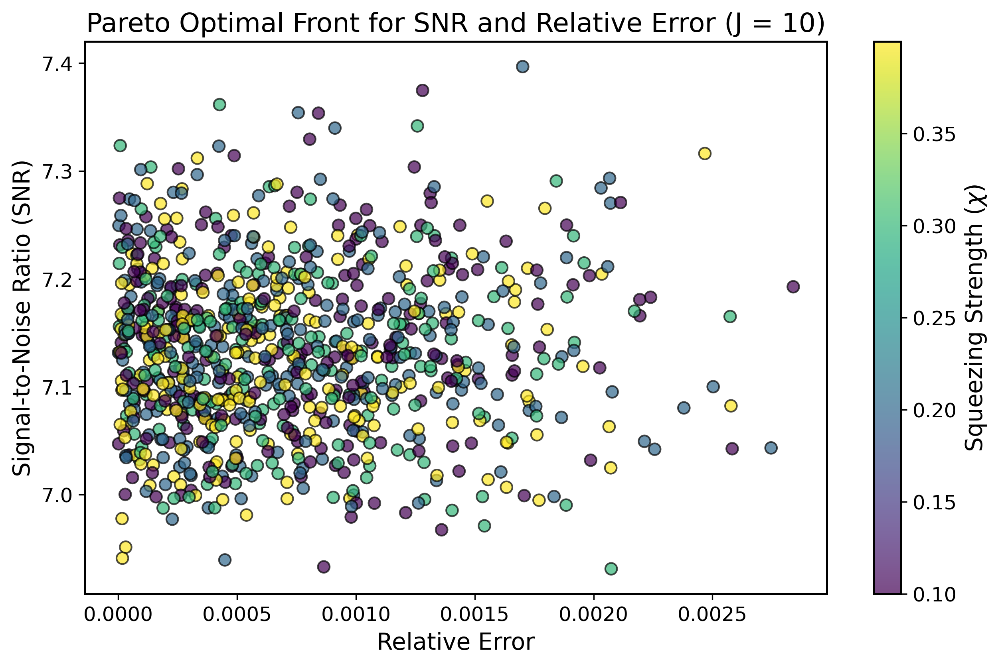

Number of Pareto Optimal Points for J = 10: 912

Statistics for Pareto Optimal Points for J = 10:
  - Average SNR: 7.13e+00
  - Max SNR: 7.40e+00
  - Min SNR: 6.93e+00

  - Average Relative Error: 7.2515e-04
  - Max Relative Error: 2.8402e-03
  - Min Relative Error: 8.8188e-07

  - Average Chi: 2.4727e-01
  - Average Alpha: 3.2601e+00
  - Average Beta: 1.6766e+00

At least ten Pareto optimal combinations for J = 10 where chi > 0:

  Example 1: J = 10, chi = 1.9990e-01, alpha = 0.0000e+00, beta = 2.1666e-01, SNR = 7.40e+00, Relative Error = 1.7016e-03
  Example 2: J = 10, chi = 2.9990e-01, alpha = 0.0000e+00, beta = 2.1666e-01, SNR = 7.11e+00, Relative Error = 4.3962e-04
  Example 3: J = 10, chi = 3.9990e-01, alpha = 0.0000e+00, beta = 2.1666e-01, SNR = 7.09e+00, Relative Error = 1.7287e-03
  Example 4: J = 10, chi = 9.9900e-02, alpha = 0.0000e+00, beta = 3.2499e-01, SNR = 7.23e+00, Relative Error = 1.1095e-03
  Example 5: J = 10, chi = 1.9990e-01, alpha = 0.0000e+00, beta = 4.3332e-01,

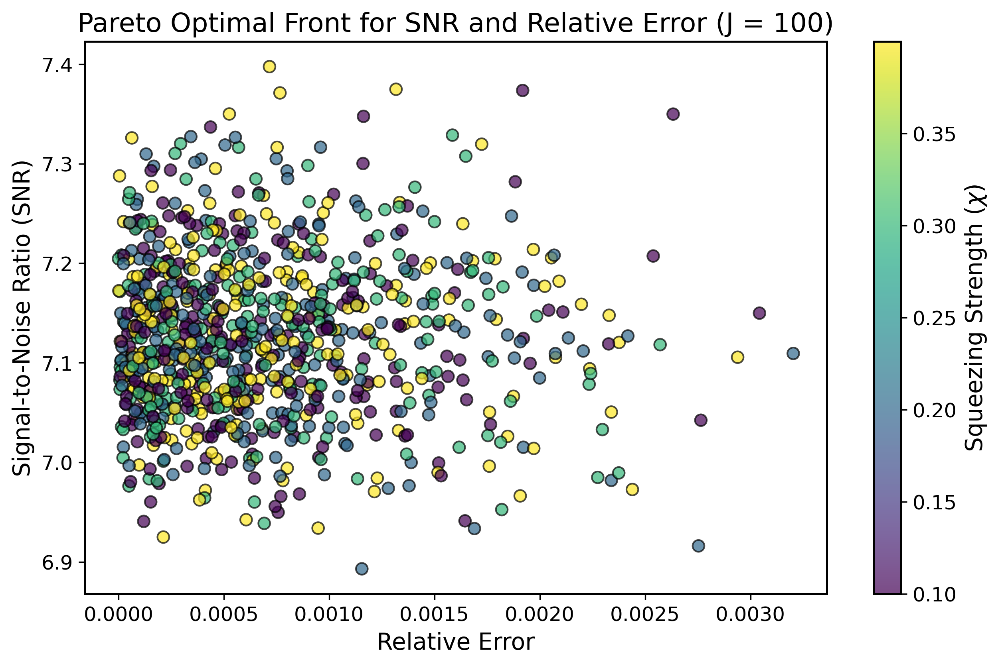

Number of Pareto Optimal Points for J = 100: 917

Statistics for Pareto Optimal Points for J = 100:
  - Average SNR: 7.13e+00
  - Max SNR: 7.40e+00
  - Min SNR: 6.89e+00

  - Average Relative Error: 7.0379e-04
  - Max Relative Error: 3.2031e-03
  - Min Relative Error: 1.3215e-07

  - Average Chi: 2.4810e-01
  - Average Alpha: 3.2142e+00
  - Average Beta: 1.5913e+00

At least ten Pareto optimal combinations for J = 100 where chi > 0:

  Example 1: J = 100, chi = 9.9900e-02, alpha = 0.0000e+00, beta = 1.0833e-01, SNR = 7.01e+00, Relative Error = 6.3534e-04
  Example 2: J = 100, chi = 1.9990e-01, alpha = 0.0000e+00, beta = 1.0833e-01, SNR = 7.24e+00, Relative Error = 4.1484e-04
  Example 3: J = 100, chi = 2.9990e-01, alpha = 0.0000e+00, beta = 3.2499e-01, SNR = 7.07e+00, Relative Error = 5.7332e-04
  Example 4: J = 100, chi = 3.9990e-01, alpha = 0.0000e+00, beta = 3.2499e-01, SNR = 7.06e+00, Relative Error = 4.5580e-04
  Example 5: J = 100, chi = 3.9990e-01, alpha = 0.0000e+00, beta = 4.3

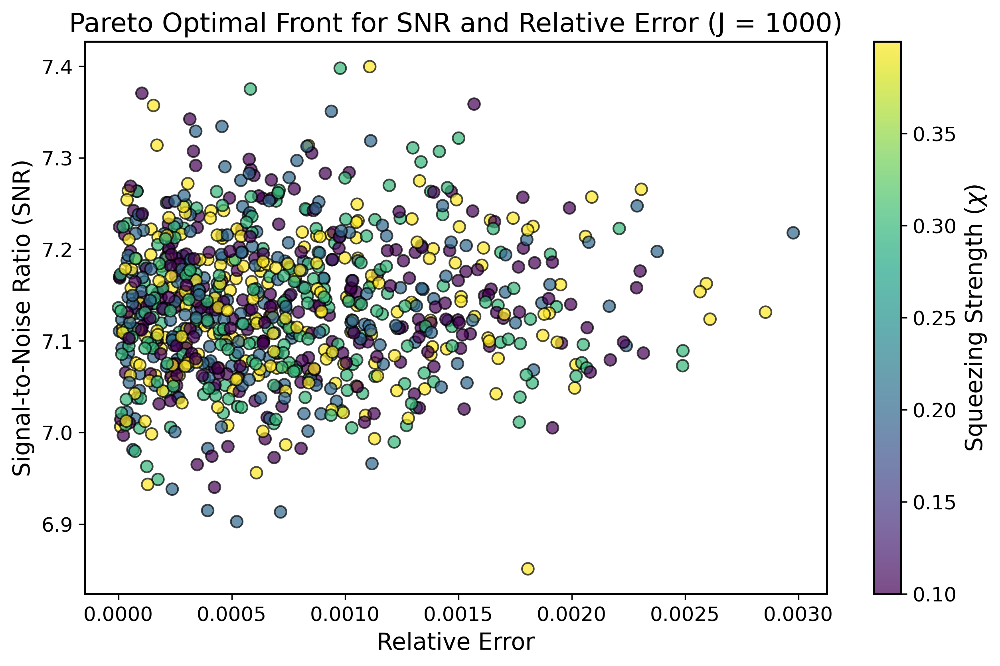

Number of Pareto Optimal Points for J = 1000: 891

Statistics for Pareto Optimal Points for J = 1000:
  - Average SNR: 7.14e+00
  - Max SNR: 7.40e+00
  - Min SNR: 6.85e+00

  - Average Relative Error: 7.4612e-04
  - Max Relative Error: 2.9772e-03
  - Min Relative Error: 5.8684e-07

  - Average Chi: 2.4794e-01
  - Average Alpha: 3.1529e+00
  - Average Beta: 1.6127e+00

At least ten Pareto optimal combinations for J = 1000 where chi > 0:

  Example 1: J = 1000, chi = 2.9990e-01, alpha = 0.0000e+00, beta = 2.1666e-01, SNR = 7.14e+00, Relative Error = 5.8684e-07
  Example 2: J = 1000, chi = 2.9990e-01, alpha = 0.0000e+00, beta = 3.2499e-01, SNR = 7.10e+00, Relative Error = 2.8091e-04
  Example 3: J = 1000, chi = 9.9900e-02, alpha = 0.0000e+00, beta = 6.4998e-01, SNR = 7.22e+00, Relative Error = 5.4416e-04
  Example 4: J = 1000, chi = 3.9990e-01, alpha = 0.0000e+00, beta = 6.4998e-01, SNR = 7.10e+00, Relative Error = 2.9918e-04
  Example 5: J = 1000, chi = 9.9900e-02, alpha = 0.0000e+00, be

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar
from scipy.signal import blackmanharris
import os
from joblib import Parallel, delayed
import multiprocessing

# -------------------------------
# 1. Configuration and Setup
# -------------------------------

# Create a directory to save the plots
output_dir = 'pareto_plots'
os.makedirs(output_dir, exist_ok=True)

# Update plotting parameters for better aesthetics
plt.rcParams.update({
    'font.size': 20,
    'axes.titlesize': 22,
    'axes.labelsize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 300,
    'axes.linewidth': 1.5,
    'lines.linewidth': 2,
    'lines.markersize': 8,
})
# -------------------------------
# 2. Define Constants and Parameters
# -------------------------------

# Constants
omega_0 = 1.0
np_val = 4.0
omega_est = omega_0
ns = 30
nspad = 1000

# Squeezing parameters
chi_values = [0, 0.0999, 0.1999, 0.2999, 0.3999]
J_values = [10, 100, 1000]

# Seed for reproducibility
np.random.seed(37)

# Parameters for noise
sigma = 0.1 * omega_0  # 10% of omega_0
dsn = 10000  # Number of noisy samples (reduced for faster execution)

# Define alpha and beta values
alpha_values = np.linspace(0, 2 * np.pi, 30)  # 30 points from 0 to 2pi
beta_values = np.linspace(0, np.pi, 30)        # 30 points from 0 to pi

# -------------------------------
# 3. Define the Expectation Function
# -------------------------------

def jalphabeta(alpha, beta, chi, omega, t, J):
    """
    Computes the expectation value based on the given parameters.
    """
    return J * np.sin(beta) * (np.cos(chi) ** (2 * J - 1)) * np.cos(alpha - omega * t)

# -------------------------------
# 4. Define the FFT Function with Padding
# -------------------------------

def gfft_sig(chi, omega_0, alpha, beta, np_val, omega_est, ns, nspad, J):
    """
    Performs BMH FFT on the padded data and returns the frequency and power spectrum.
    """
    T_max = np_val * (2 * np.pi) / omega_est
    delta_t = (np_val / (ns - 1)) * (2 * np.pi) / omega_est
    time_sampling = np.linspace(0, T_max, ns)

    # Generate Blackman-Harris window
    window = blackmanharris(ns)

    # Data calculation with window applied
    data = np.array([jalphabeta(alpha, beta, chi, omega_0, t, J) for t in time_sampling]) * window

    # Zero-padding
    data_padded = np.pad(data, (0, nspad - len(data)), 'constant')
    spectrum_length = len(data_padded) // 2
    freq_range = (2 * np.pi) / ((nspad - 1) * delta_t) * np.arange(spectrum_length)
    fft_data = np.abs(fft(data_padded))[:spectrum_length] ** 2
    return np.column_stack((freq_range, fft_data))

# -------------------------------
# 5. Define the FFT Data Generation Function
# -------------------------------

def data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn):
    """
    Generates FFT data with added noise.
    """
    delta_omega = np.random.normal(0, sigma, dsn)
    fft_results = []
    for delta in delta_omega:
        current_omega = omega_0 + delta
        fft_result = gfft_sig(chi, current_omega, alpha, beta, np_val, omega_est, ns, nspad, J)
        fft_results.append(fft_result)
    return fft_results

# -------------------------------
# 6. Define the Processing Function for Each Parameter Combination
# -------------------------------

def process_combination(J, chi, alpha, beta):
    """
    Processes a single combination of parameters:
    - Generates FFT data with noise.
    - Computes SNR and Relative Error.
    Returns the results or None if an error occurs.
    """
    try:
        # Generate FFT data with noise
        fft_data = data_fft(alpha, beta, chi, omega_0, np_val, omega_est, ns, nspad, J, sigma, dsn)
        
        # Convert list of arrays to 2D array: (dsn, spectrum_length, 2)
        fft_array = np.array(fft_data)  # Shape: (dsn, spectrum_length, 2)
        
        # Extract frequency and power
        freq_values = fft_array[0, :, 0]  # Frequencies are same across all FFTs
        power_values = fft_array[:, :, 1]  # Shape: (dsn, spectrum_length)
        
        # Calculate average and standard deviation across dsn
        fft_avg = np.mean(power_values, axis=0)  # Shape: (spectrum_length,)
        fft_stddev = np.std(power_values, axis=0)  # Shape: (spectrum_length,)
        
        # Interpolation to find max peak of fft_avg
        fft_avg_interp = interp1d(freq_values, fft_avg, kind='cubic')
        max_peak_freq = minimize_scalar(lambda x: -fft_avg_interp(x),
                                       bounds=(freq_values[0], freq_values[-1]),
                                       method='bounded').x
        
        # Interpolation of SNR data
        snr_data = np.divide(fft_avg, fft_stddev, out=np.zeros_like(fft_avg), where=fft_stddev!=0)
        snr_interp = interp1d(freq_values, snr_data, kind='cubic', bounds_error=False, fill_value="extrapolate")
        max_snr = snr_interp(max_peak_freq)
        
        # Relative Error in Frequency
        relative_error_freq = np.abs(1 - (max_peak_freq / omega_0))
        # Ensure relative error is not zero
        relative_error_freq = max(relative_error_freq, 1e-10)
        
        # Store actual alpha and beta (not normalized)
        alpha_actual = alpha  # 0 to 2pi
        beta_actual = beta    # 0 to pi
        
        return (J, chi, alpha_actual, beta_actual, max_snr, relative_error_freq)
    
    except Exception as e:
        print(f"Error processing J={J}, chi={chi}, alpha={alpha}, beta={beta}: {e}")
        return None

# -------------------------------
# 7. Perform Parallel Processing Using Joblib
# -------------------------------

def main():
    # Generate all parameter combinations
    param_combinations = []
    for J in J_values:
        for chi in chi_values:
            for alpha in alpha_values:
                for beta in beta_values:
                    param_combinations.append((J, chi, alpha, beta))
    
    # Determine the number of available CPU cores
    num_cores = multiprocessing.cpu_count()
    
    print("Starting parallel data processing...")
    
    # Perform parallel processing
    results = Parallel(n_jobs=num_cores)(
        delayed(process_combination)(J, chi, alpha, beta) for (J, chi, alpha, beta) in param_combinations
    )
    
    print("Parallel data processing completed.")
    
    # Filter out None results
    results = [res for res in results if res is not None]
    
    # -------------------------------
    # 8. Find Pareto Optimal Points for Each Combination of Alpha and Beta for Each J
    # -------------------------------
    for J in J_values:
        pareto_points = []
        ten_pareto_examples = []
        for alpha in alpha_values:
            for beta in beta_values:
                # Filter results for chi = 0 and specific alpha, beta
                base_results = [res for res in results if res[0] == J and res[1] == 0 and res[2] == alpha and res[3] == beta]
                if not base_results:
                    continue
                base_result = base_results[0]
                snr_base = base_result[4]
                rel_err_base = base_result[5]
                
                # Find Pareto optimal points for chi > 0 with the same alpha, beta
                for res in results:
                    if res[0] == J and res[1] > 0 and res[2] == alpha and res[3] == beta:
                        _, chi, alpha_val, beta_val, snr_chi, rel_err_chi = res
                        if snr_chi > snr_base and rel_err_chi < rel_err_base:
                            pareto_points.append(res)
                            # Collect at least ten examples where chi > 0
                            if len(ten_pareto_examples) < 10:
                                ten_pareto_examples.append((J, chi, alpha_val, beta_val, snr_chi, rel_err_chi))
        
        # -------------------------------
        # 9. Plot Pareto Optimal Points for Each J
        # -------------------------------

        def plot_pareto_optimal(pareto_points, J):
            if not pareto_points:
                print(f"No Pareto optimal points found for J = {J}.")
                return

            fig, ax = plt.subplots(figsize=(10, 6))

            # Extract data for plotting
            J_vals, chi_vals, alpha_vals, beta_vals, snr_vals, rel_err_vals = zip(*pareto_points)

            # Scatter plot of Pareto optimal points
            scatter = ax.scatter(rel_err_vals, snr_vals, c=chi_vals, cmap='viridis', s=50, edgecolors='k', alpha=0.7)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(r'Squeezing Strength ($\chi$)', fontsize=14)

            # Set labels and title
            ax.set_xlabel('Relative Error', fontsize=14)
            ax.set_ylabel('Signal-to-Noise Ratio (SNR)', fontsize=14)
            ax.set_title(f'Pareto Optimal Front for SNR and Relative Error (J = {J})', fontsize=16)

            # Save the plot
            filename = f"Pareto_Optimal_Front_Jalpatenbmh10_{J}.pdf"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format='pdf')
            plt.show()

        # Plot the Pareto optimal points for the current J
        plot_pareto_optimal(pareto_points, J)

        # -------------------------------
        # 10. Output Statistics for Pareto Optimal Points for Each J
        # -------------------------------

        def output_pareto_statistics(pareto_points, ten_pareto_examples, J):
            if not pareto_points:
                print(f"No Pareto optimal points to display statistics for J = {J}.")
                return

            num_points = len(pareto_points)
            print(f"Number of Pareto Optimal Points for J = {J}: {num_points}\n")

            # Calculate and display summary statistics
            snr_vals = [point[4] for point in pareto_points]
            rel_err_vals = [point[5] for point in pareto_points]
            chi_vals = [point[1] for point in pareto_points]
            alpha_vals = [point[2] for point in pareto_points]
            beta_vals = [point[3] for point in pareto_points]

            print(f"Statistics for Pareto Optimal Points for J = {J}:")
            print(f"  - Average SNR: {np.mean(snr_vals):.2e}")
            print(f"  - Max SNR: {np.max(snr_vals):.2e}")
            print(f"  - Min SNR: {np.min(snr_vals):.2e}\n")
            print(f"  - Average Relative Error: {np.mean(rel_err_vals):.4e}")
            print(f"  - Max Relative Error: {np.max(rel_err_vals):.4e}")
            print(f"  - Min Relative Error: {np.min(rel_err_vals):.4e}\n")
            print(f"  - Average Chi: {np.mean(chi_vals):.4e}")
            print(f"  - Average Alpha: {np.mean(alpha_vals):.4e}")
            print(f"  - Average Beta: {np.mean(beta_vals):.4e}\n")
            
            # Output information for at least ten Pareto optimal combinations where chi > 0
            print(f"At least ten Pareto optimal combinations for J = {J} where chi > 0:\n")
            for idx, example in enumerate(ten_pareto_examples):
                J, chi, alpha, beta, snr, rel_err = example
                print(f"  Example {idx + 1}: J = {J}, chi = {chi:.4e}, alpha = {alpha:.4e}, beta = {beta:.4e}, SNR = {snr:.2e}, Relative Error = {rel_err:.4e}")

        # Output statistics for Pareto optimal points for the current J
        output_pareto_statistics(pareto_points, ten_pareto_examples, J)

    print("Pareto optimal analysis completed.")

if __name__ == "__main__":
    main()
